In [1]:
%matplotlib notebook
import numpy as np
import pickle
from glob import glob
from matplotlib import pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import scipy as sp
from scipy.optimize import minimize
from scipy.interpolate import Rbf

from donutlib.donututil import getZemaxWfm

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


In [2]:
# load pickles

wave_extraf = pickle.load(open('/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/decam_2012-nominalzernike-1.5mmextrafocal.pickle','rb'))
wave_inf = pickle.load(open('/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/decam_2012-nominalzernike.pickle','rb'))

wave_extraf_decenter = pickle.load(open('/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/decam_2012-nominalzernike-1.5mmextrafocal-decenter.pickle','rb'))
wave_inf_decenter = pickle.load(open('/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/decam_2012-nominalzernike-decenter.pickle','rb'))



# build Rbf for each

interpDict_extraf = {}
for iZ in range(3,37):    # numbering is such that iZ=3 is zern4
    interpDict_extraf[iZ] = Rbf(wave_extraf['x'], wave_extraf['y'], wave_extraf['zcoeff'][:,iZ])        
    
interpDict_extraf_decenter = {}
for iZ in range(3,37):    # numbering is such that iZ=3 is zern4
    interpDict_extraf_decenter[iZ] = Rbf(wave_extraf_decenter['x'], wave_extraf_decenter['y'], wave_extraf_decenter['zcoeff'][:,iZ])        

interpDict_inf = {}
for iZ in range(3,37):    # numbering is such that iZ=3 is zern4
    interpDict_inf[iZ] = Rbf(wave_inf['x'], wave_inf['y'], wave_inf['zcoeff'][:,iZ])        

interpDict_inf_decenter = {}
for iZ in range(3,37):    # numbering is such that iZ=3 is zern4
    interpDict_inf_decenter[iZ] = Rbf(wave_inf_decenter['x'], wave_inf_decenter['y'], wave_inf_decenter['zcoeff'][:,iZ])        





<IPython.core.display.Javascript object>


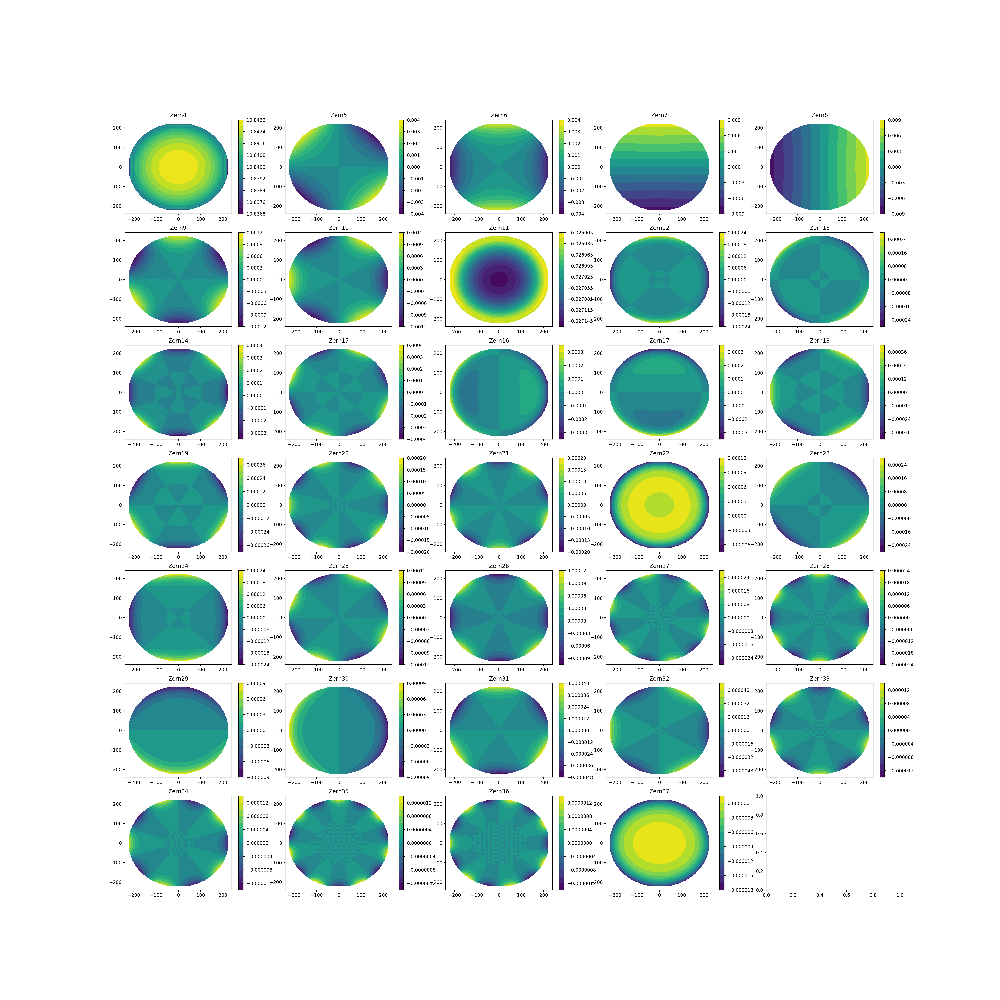

In [3]:
# plot difference in Wavefront - diff=extrafocal-infocus
f,ax = plt.subplots(7,5,figsize=(30,30))
axf = ax.flatten()
aplots = []

yin, xin = np.mgrid[-235.:235.:100j,-235.:235.:100j]
rin = np.sqrt(xin*xin+yin*yin)
ok = rin<=225.
xgood = xin[ok]
ygood = yin[ok]

for iz in range(3,37):
    zern_extraf = interpDict_extraf[iz](xgood,ygood)
    zern_inf = interpDict_inf[iz](xgood,ygood)
    zern_diff = zern_extraf-zern_inf
    aplot = axf[iz-3].tricontourf(xgood, ygood, zern_diff, 15)
    axf[iz-3].set_xlim(-240,240)
    axf[iz-3].set_ylim(-240,240)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


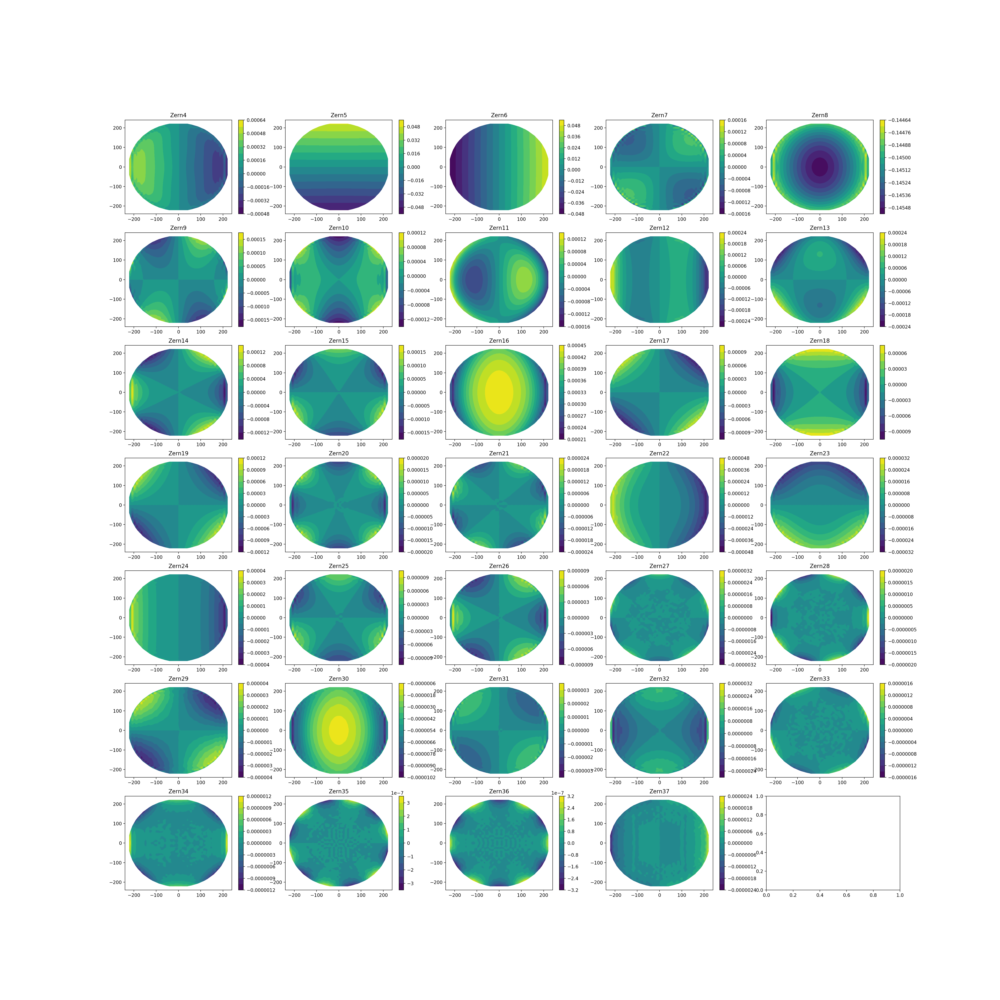

In [4]:
# plot difference in Wavefront - diff=extrafocal_decenter - extrafocal
f,ax = plt.subplots(7,5,figsize=(30,30))
axf = ax.flatten()
aplots = []

yin, xin = np.mgrid[-235.:235.:100j,-235.:235.:100j]
rin = np.sqrt(xin*xin+yin*yin)
ok = rin<=225.
xgood = xin[ok]
ygood = yin[ok]

for iz in range(3,37):
    zern_extraf = interpDict_extraf[iz](xgood,ygood)
    zern_extraf_decenter = interpDict_extraf_decenter[iz](xgood,ygood)
    zern_diff = zern_extraf_decenter-zern_extraf
    aplot = axf[iz-3].tricontourf(xgood, ygood, zern_diff, 15)
    axf[iz-3].set_xlim(-240,240)
    axf[iz-3].set_ylim(-240,240)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


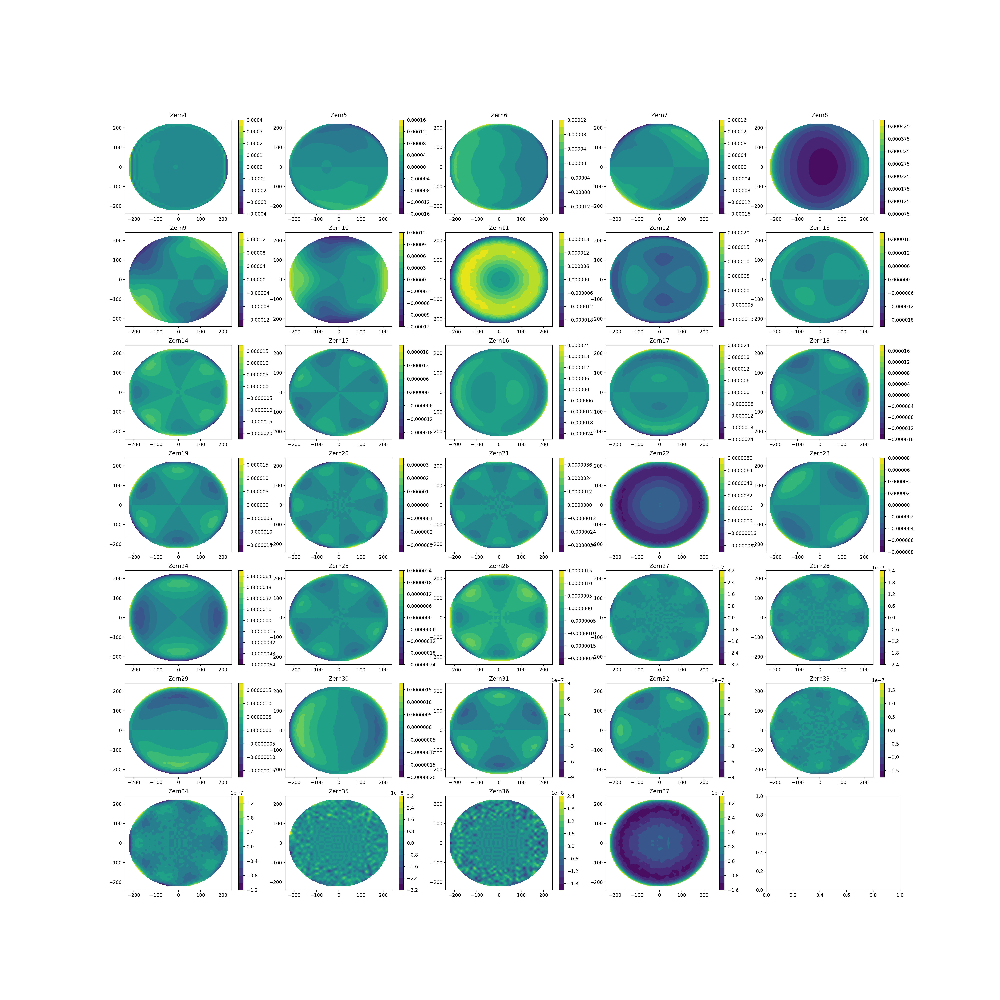

In [5]:
# plot difference in Wavefront - diff=(extrafocal_decenter - extrafocal) - (infocus_decenter - infocus)
f,ax = plt.subplots(7,5,figsize=(30,30))
axf = ax.flatten()
aplots = []

yin, xin = np.mgrid[-235.:235.:100j,-235.:235.:100j]
rin = np.sqrt(xin*xin+yin*yin)
ok = rin<=225.
xgood = xin[ok]
ygood = yin[ok]

for iz in range(3,37):
    zern_extraf = interpDict_extraf[iz](xgood,ygood)
    zern_extraf_decenter = interpDict_extraf_decenter[iz](xgood,ygood)
    
    zern_inf = interpDict_inf[iz](xgood,ygood)
    zern_inf_decenter = interpDict_inf_decenter[iz](xgood,ygood)
    
    zern_diff = (zern_extraf_decenter-zern_extraf) - (zern_inf_decenter-zern_inf)
    aplot = axf[iz-3].tricontourf(xgood, ygood, zern_diff, 15)
    axf[iz-3].set_xlim(-240,240)
    axf[iz-3].set_ylim(-240,240)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


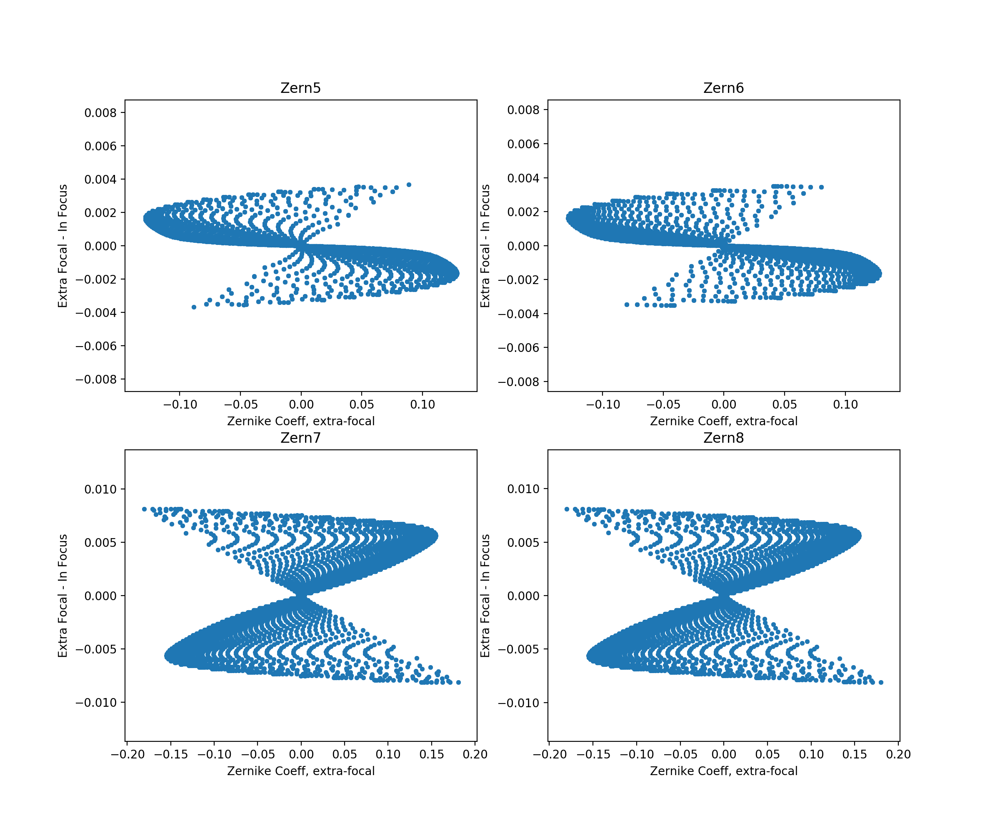

In [6]:
# for Coma & Astigmatism, plot the difference vs. the value of the aberration, at each focal plane position
# plot difference in Wavefront - diff=extrafocal-infocus
f,ax = plt.subplots(2,2,figsize=(12,10))
axf = ax.flatten()
aplots = []

yin, xin = np.mgrid[-235.:235.:100j,-235.:235.:100j]
rin = np.sqrt(xin*xin+yin*yin)
ok = rin<=225.
xgood = xin[ok]
ygood = yin[ok]

for iz in range(4,8):
    zern_extraf = interpDict_extraf[iz](xgood,ygood)
    zern_inf = interpDict_inf[iz](xgood,ygood)
    zern_diff = zern_extraf-zern_inf
    aplot = axf[iz-4].scatter(zern_extraf, zern_diff, marker='.')
    axf[iz-4].set_xlabel('Zernike Coeff, extra-focal')
    axf[iz-4].set_ylabel('Extra Focal - In Focus')

    axf[iz-4].set_title("Zern%d" % (iz+1))